# NY TAXI DATA SCIENCE

____

## Contents 


#### Insight 1: Passenger Numbers

#### Insight 2: Cash versus Credit 

#### Insight 3: Fare Breakdown

#### Insight 4: Pick-up and Drop-off Locations 

#### Insight 5: Average Fare by Day and Time

#### Insight 6: Busiest City Locations


____

## Summary


**Solutions to** the **bold questions** below are included in this notebook


### Suggested Basic Questions:

1. What are the **distributions of the number of passengers per trip** **<span style="color:green">(see Insight 1)</span>**, **payment type, fare amount, tip amount, and total amount** **<span style="color:green">(see Insights 2 and 3)</span>**?

2. What are top 5 busiest hours of the day, and the **top 10 busiest locations of the city**? **<span style="color:green">(see Insight 6)</span>**

3. What is the **hourly taxi activity for each day of the week** **<span  style="color:green">(see Insight 5)</span>**?

4. **Which trip has the most consistent fares** **<span style="color:green">(see Insight 2)</span>**? 
  <span style="color:green"> Manhattan to JFK Airport (set fare of $52)</span>



### Suggested Open Questions:


1. Can you predict the fare and tip amount based on the pickup / drop off location, time, and day of the week?

2. Can you predict the pickup / drop off geographical distribution for each hour of a weekday?

3. ** If you were a taxi owner, how would you maximize your earnings in a day? **
    <span style="color:green">Work the early shift (The data show above average fares from 3 am until 7 am)</span>

4. **If you run a taxi company, how would you maximize your earnings?**
    <span style="color:green">In short: More data needed! </span>

    <span style="color:green"> Uber is a major market disruptor in the taxi space.  To maximise taxi company earnings is necessary to discover how old school taxis can strategically adapt to thrive in current market conditions.   </span>  
    
     <span style="color:green">Data needed to support the taxi company to maximise their earnings going forward could include: </span>  
     *  <span style="color:green">Concurrent analysis of Uber versus taxi data </span>  
     *  <span style="color:green">Trends within taxi data for the last 2-3 years </span>  
   
       <span style="color:green">The data show that most taxis are hailed from busy streets (Insight 4).  On cold NY winter mornings (or in the rain!) does Uber now take a big share of the historical taxi market (direct from door pick up rather than walking to major route to hail a taxi).  Issue temporarily addressed with UberT (could request a yellow taxi to your door through the Uber app, $2 surcharge to Uber, service ended Aug 2016).  </span>  
       
       <span style="color:green"> Taxis do have some advantages over Uber:  (i) Street pick up capability (ii) Brand Image (safety, reliability, corporate social responsibility)</span>
       
       <span style="color:green"> Recommendation - Use data to capitalise upon taxi advantages:</span>
       
     *  <span style="color:green">Real-time data-driven supply and demand predictions, with corresponding distribution of taxis for seamless street pick ups</span>
     *  <span style="color:green">If targeting the pick up market: Focus on data driven reliability - use AI to centrally manage  taxis in real time "The Borg" style to increase customer confidence </span>


In [18]:
import pandas as pd
import numpy as np
import matplotlib  
import matplotlib.pyplot as plt 
import plotly.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, plot
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly import tools
from IPython.display import Image
from IPython.display import display, Math, Latex 
from IPython.core.display import HTML
import random as r
import calendar


#initiate the Plotly Notebook mode
init_notebook_mode()


df_big = pd.read_csv('../data/yellow_tripdata_2016-01.csv')

#optional data cleaning 
#df_big_clean=df_big.fillna(df_big.mean())#df_big.dropna(axis=1) 
#df_big_clean <- df_big[!(is.na(df$start_pc) | df$start_pc==""), ] #| is an or-operator and ! inverts. 
#Hence, the command above displays all rows, which are not b) NA or b) equal to ""

df_big_clean=df_big #run this line to leave data uncleaned

#reduce data points for testing using random sample
indexnums=r.sample(list(np.arange(1,2389990,1)), 10000)
df=df_big_clean.loc[indexnums,:]  #use to reduce data points for testing mode
#df=df_big                      # or use this line to keep whole month of data

#df #use this to view the dataframe

# what does the data cover?
df1=df_big
# Make new columns in alternate dataframe with hour of day and day of the week etc
df1['hour'] = pd.to_datetime(df1['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.hour
df1['day'] = pd.to_datetime(df1['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.dayofweek
df1['numday'] = pd.to_datetime(df1['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.day
df1['month'] = pd.to_datetime(df1['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.month
df1['year'] = pd.to_datetime(df1['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.year

print('This set contains', df_big.shape[0], 'NY Taxi  data points.')
out1=df1.year.unique()
out1.sort()
print('The data include, Years:', out1)
out2=df1.month.unique()
out2.sort()
out2=calendar.month_abbr[int(out2)]  #added int to force integer as otherwise python gave deprciation warning
print('The data include, Months:', out2)
out3=df1.numday.unique()
out3.sort()
print('The data include, days of month:', out3)
out4=df1.day.unique()
out4.sort()
weekdaystr = dict()
for i in range(0,7):
    weekdaystr[i]=calendar.day_abbr[int(out4[i])]
print('The data include, weekdays:', weekdaystr)

This set contains 2389990 NY Taxi  data points.
The data include, Years: [2016]
The data include, Months: Jan
The data include, days of month: [ 1  2  3  4  5  6  7  8  9 10 11 12 15 16 27 28 29]
The data include, weekdays: {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}


## Insight 1: Passenger numbers
 * Most NY Taxi trips transport solo passengers.  For every 10 taxi trips, 7 are taken by solo passengers.

In [3]:
import numpy as np
import plotly.plotly as py
#import plotly.offline as offline
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, plot
import plotly.graph_objs as go
init_notebook_mode()

#extract number of people per trip
peps_per_trip_df=df.loc[:, df.columns.str.match('passenger_count')]
peps_per_trip_df.shape
#print(type(peps_per_trip_df))
peps_per_trip=df.loc[:, df.columns.str.match('passenger_count')].values
#print(type(peps_per_trip))

#layout=go.Layout(title="First Plot", xaxis={'title':'x1'}, yaxis={'title':'x2'})
data = [go.Histogram(x=peps_per_trip)]  #or [dataset1, darset2]
layout = go.Layout(
    title='Histogram of Passenger numbers',
    xaxis=dict(
        title='passenger number'
    ),
    yaxis=dict(
        title='Count'
    ),
    bargap=0.2,
    bargroupgap=0.1
)

fig = go.Figure(data=data, layout=layout)
#iplot(fig,  filename='People_per_trip_histogram') #This plots when offline; no limit; seems to be an issue with offline plot in this case, but all others in this notebook are good.  
py.iplot(fig,  filename='People_per_trip_histogram') #this plots in online mode, limit of 50/day in community a/c, need online version to work in kyso

High five! You successfuly sent some data to your account on plotly. View your plot in your browser at https://plot.ly/~elmao/0 or inside your plot.ly account where it is named 'People_per_trip_histogram'


## Insight 2: Cash versus Credit 


* New Yorkers prefer to pay with credit card (56:43 ratio in preference of credit card)


* Cash usage remains considerable at 43%. The cash option is a point of difference over competitor Uber.  


* Distribution of fares is similar across cash and credit card payments (median credit card fare is $1 higher than cash fare)


* Peak at $52 represents Manhattan -> JFK airport trips (This journey has a flat rate fee, source [@wikipedia](https://en.wikipedia.org/wiki/Taxicabs_of_New_York_City))
 

* NY taxi fares are cheap (compared to Melbourne!). Median fare around \$10



In [20]:
# Distribution: Payment by type
#df=df_big  #uncomment to run on whole dataset

# Add histogram data
# extract fares by payment type
# 1=cc, 2=cash, 3=no charge, 4=dispute, 5=unknown, 6=voided trip
fare_paymenttype1=df.loc[df['payment_type'] == 1, 'fare_amount'].values #credit card
fare_paymenttype2=df.loc[df['payment_type'] == 2, 'fare_amount'].values #cash
#fare_paymenttype4=df.loc[df['payment_type'] == 4, 'fare_amount'].values #dispute
fare_payments=np.append(fare_paymenttype1,fare_paymenttype2)
total_paymentstype1=df.loc[df['payment_type'] == 1, 'total_amount'].values   #fare+tips+tols
total_paymentstype2=df.loc[df['payment_type'] == 2, 'total_amount'].values   #fare+tips+tols
tip_amountstype1=df.loc[df['payment_type'] == 1, 'tip_amount'].values   #fare+tips+tols
total_payments=np.append(total_paymentstype1,total_paymentstype2)

numberofCCpays=df.loc[df['payment_type'] == 1, 'payment_type'].sum()
numberofCashpays=df.loc[df['payment_type'] == 2, 'payment_type'].sum()/2
PcentofCCpays=np.round(numberofCCpays*100/(numberofCashpays+numberofCCpays), decimals=1)
#print(PcentofCCpays)
PcentofCashpays=np.round(numberofCashpays*100/(numberofCashpays+numberofCCpays), decimals=1)
#print(PcentofCashpays)

#print(type(fare_paymenttype2[1:10]))

# Group data together
hist_data = [fare_paymenttype1,fare_paymenttype2]
find_median1=np.median(fare_paymenttype1)
find_median2=np.median(fare_paymenttype2)
#print(find_median)

group_labels = ['Credit card', 'Cash']


# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=1.0)
fig.layout.update({'title': 'Distribution of Fares'})
fig.layout.xaxis1.update({'title': '$ amounts'})


display(Math(r'\text{Percentage of credit card payments is } %s \text{%%}' % PcentofCCpays))
display(Math(r'\text{Median credit payment is \$} %s ' % find_median1))
display(Math(r'\text{Percentage of cash payments is  } %s \text{%%}' % PcentofCashpays))
display(Math(r'\text{Median cash payment is \$} %s' % find_median2))

# Plot!
#iplot(fig, filename='Distplot with Multiple Datasets') #offline mode
py.iplot(fig, filename='Distplot with Multiple Datasets') #online plot mode

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

## Insight 3: Fare Breakdown


* Median Tip (credit card data only) is 20% of the fare

In [6]:
# Group data together
hist_data2 = [fare_payments,total_payments,tip_amountstype1]


group_labels2 = ['Fare', 'Total Charge', 'Tip Amount']



# Create distplot with custom bin_size
fig2 = ff.create_distplot(hist_data2, group_labels2, bin_size=[0.5,0.5,0.4])
fig2.layout.update({'title': 'Breakdown & Distribution of NY Taxi Fares'})
fig2.layout.xaxis1.update({'title': '$ amounts'})




find_mediantip=np.median(tip_amountstype1)
Med_tip_percentage=np.round(find_mediantip*100/find_median1, decimals=1)

display(Math(r'\text{Median tip payment (Credit card payment data only) is \$} %s ' % find_mediantip))
display(Math(r'\text{Median tip percentage (Credit card payment data only) is } %s \text{%%}' % Med_tip_percentage))

# Plot!

#iplot(fig2, filename='Distplot with Multiple Datasets2') # offline plot option
py.iplot(fig2, filename='Distplot with Multiple Datasets3') # online plot option

<IPython.core.display.Math object>

<IPython.core.display.Math object>

## Insight 4: Pick-up and Drop-off Locations 


* Manhattan (central business zone) is the busiest area for taxi use


* Airports (La Guardia and JFK) feature strongly in usage maps
    * Curiously, people get dropped off to the airports at very fixed locations, while pick-up locations are more diffuse  
        * Is there a culture of people wandering out from the airport and hailing taxis from wherever; no easily to locate taxi ranks; a GPS issue; meters started on the move?
        
        
* People **start taxi journeys** most frequently:
    1. in Manhattan on the **main streets**
    2. on the **main arterial routes** within residential areas (Brooklyn, Queens)
        * The *Sex And The City* imagery of hailing taxis on demand from busy streets is backed up by the data.  Interesting in times of Uber.
    
    
* People **end taxi journeys** most frequently:
    1. again in Manhattan, both on main streets and off the main streets 
    2. at very **diffuse locations** across residential areas (Brooklyn, Queens, The Bronx)
        * The Bronx is a frequent drop-off location, but rarely a pick-up location 
            * An effect of green "boro taxis" since 2013? (Note, however, that boroughs where green taxis can be hailed include The Bronx, Queens and Brooklyn: yet the Bronx taxi pattern is notably different)

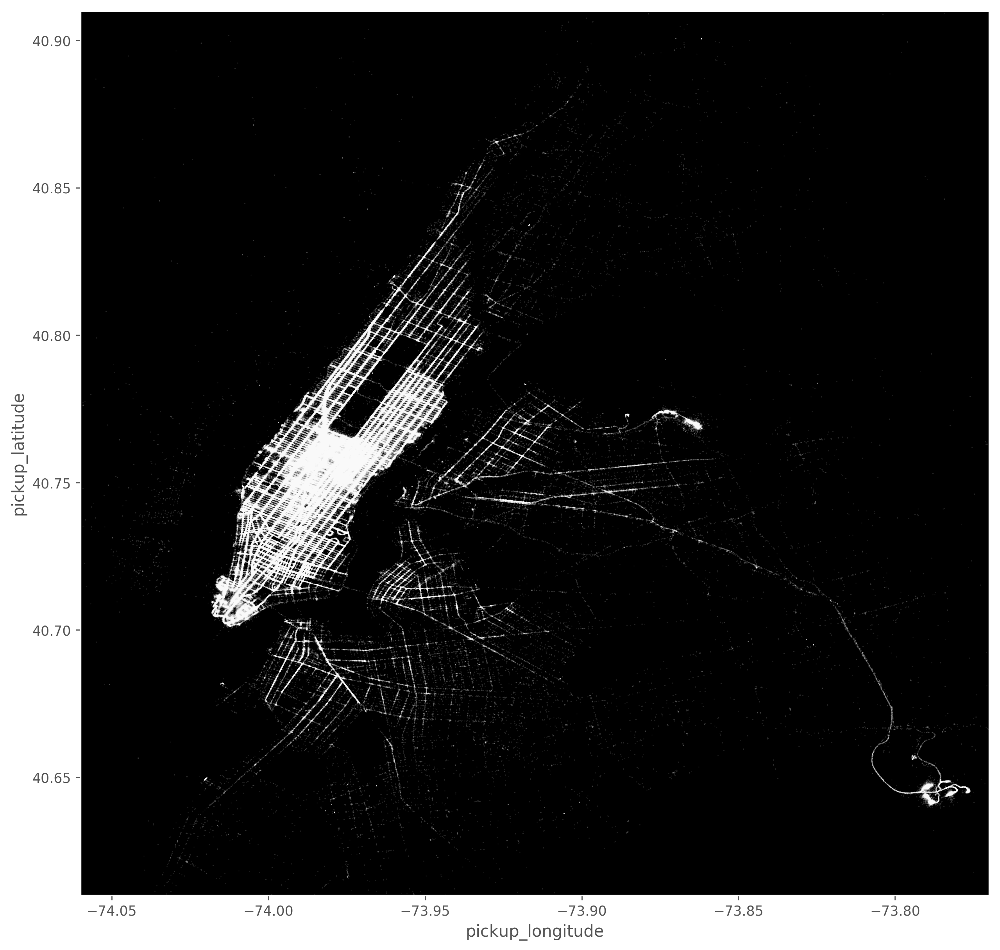

In [5]:
# Map the pick up locations
import pandas as pd
import matplotlib  
import matplotlib.pyplot as plt 
from matplotlib import rcParams  

df=df_big

#pd.options.display.mpl_style = 'default' #Better Styling 
matplotlib.pyplot.style.use('ggplot')

new_style = {'grid': False} #Grid off  
matplotlib.rc('axes', **new_style)  

rcParams['figure.figsize'] = (12, 12) #Size of figure  
rcParams['figure.dpi'] = 250

P1=df.plot(kind='scatter', x='pickup_longitude', y='pickup_latitude',color='white',xlim=(-74.06,-73.77),ylim=(40.61, 40.91),s=.02,alpha=.3)
#P.set_axis_bgcolor('black') #Background Color
P1.set_facecolor('black') #Background Colour
plt.show()

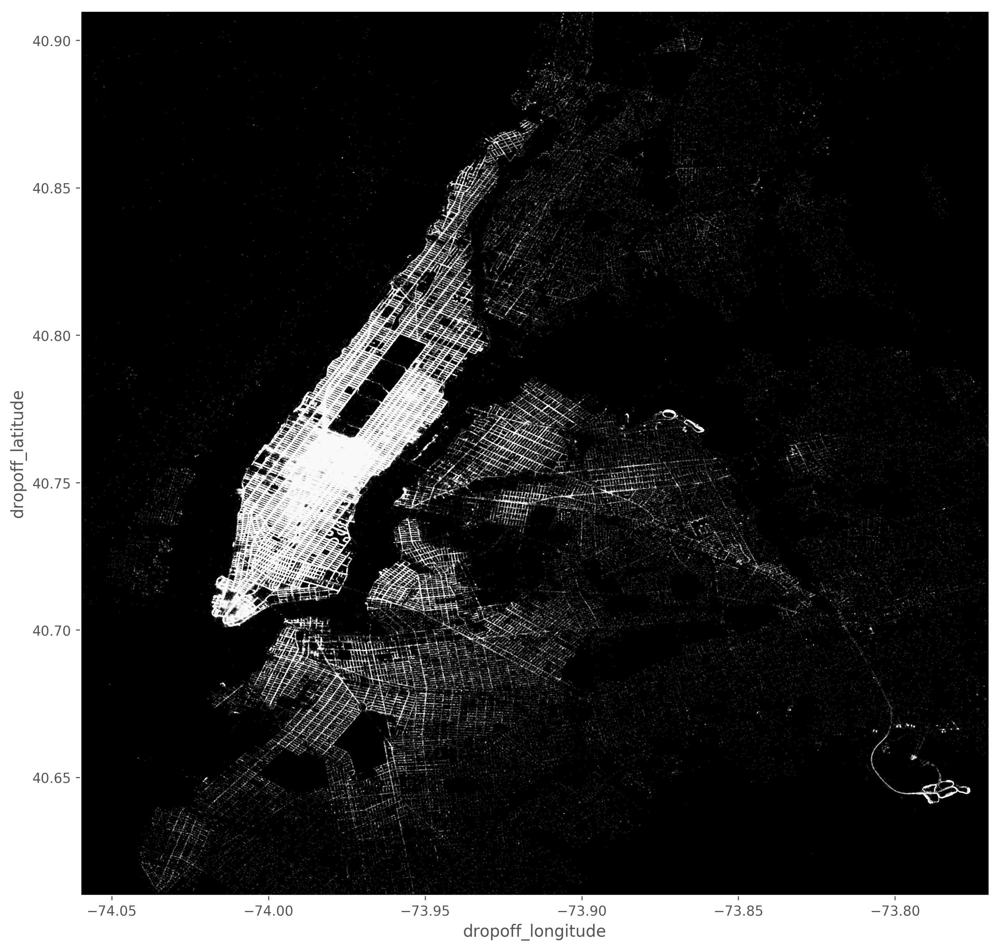

In [6]:
# Map the drop off locations
df=df_big
import matplotlib  
import matplotlib.pyplot as plt 
from matplotlib import rcParams 

##Inline Plotting for jupyter Notebook 
#%matplotlib inline 

matplotlib.pyplot.style.use('ggplot')

new_style = {'grid': False} #Grid off  
matplotlib.rc('axes', **new_style)  
 
rcParams['figure.figsize'] = (12, 12) #Size of figure  
rcParams['figure.dpi'] = 250

P2=df.plot(kind='scatter', x='dropoff_longitude', y='dropoff_latitude',color='white',xlim=(-74.06,-73.77),ylim=(40.61, 40.91),s=.02,alpha=.3)  #s is size and alpha is opaque-ness 
P2.set_facecolor('black') #Background Colour
plt.show()

## Insight 5: Average fare by day and time


* Average fare is similar over weekdays

* Early birds catch the worm: Taxi drivers operating from 3:00 am to 7:00 am earn above average fares 

In [10]:
# Times of the day versus average fare.

df=df_big  #renaming for test stage
rows, cols = df.shape
print('Number of trips analysed: ', rows)

# Make new column in dataframe with hour of day and day of the week
df['hour'] = pd.to_datetime(df['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.hour
df['day'] = pd.to_datetime(df['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.dayofweek
df['numday'] = pd.to_datetime(df['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.day
df['month'] = pd.to_datetime(df['tpep_pickup_datetime'], format='%Y-%m-%d %H:%M:%S').dt.month


#find mean fare by weekday
meanfare_byhour=[] #initialise
for i in range(0,24):
    fares_byhour=df.loc[df['hour'] == i, 'fare_amount'].values #hourly fares
    meanfare_byhour.append(np.mean(fares_byhour))
    #print(i)
    #print(meanfare_byhour)


#Numeric weekday convention is 0:'SUN', 1:'Mon', 2:'Tue',3:'Wed',4:'Thu',5:'Fri',6:'Sat'
#find mean fare by weekday
meanfare_byweekday=[] #initialise

for i in range(0,7):
    fare_byweekday=df.loc[df['day'] == i, 'fare_amount'].values #weekday fares
    meanfare_byweekday.append(np.mean(fare_byweekday))

meanacrosshoursofday=np.mean(meanfare_byhour)

#plot bar chart of mean fare by weekday
data = [go.Bar(
            x=['Sun', 'Mon', 'Tue','Wed','Thu','Fri','Sat'],
            y=meanfare_byweekday
    )]
layout = go.Layout(
    xaxis=dict(tickangle=-45),
    barmode='group',
    title='Mean Fare by Weekday',
    yaxis=dict(
        title='$'
    ),
)
fig = go.Figure(data=data, layout=layout)

# Plot!
#iplot(fig, filename='basic-barWeekday')     # offline plot option
py.iplot(fig, filename='basic-barWeekday')    # online plot option

Number of trips analysed:  2389990


In [9]:
#plot bar chart of mean fare by hour of day
traceBar1 = go.Bar(
            x=['0:00', '1:00', '2:00','3:00','4:00','5:00','6:00', '7:00','8:00','9:00','10:00', '11:00', '12:00','13:00','14:00','15:00','16:00', '17:00','18:00','19:00','20:00', '21:00', '22:00','23:00','24:00'],
            y=meanfare_byhour,
            name = 'hourly mean fare'
    )
trace2 = go.Scatter(
            x=['0:00','24:00'],
            y=[meanacrosshoursofday,meanacrosshoursofday],
            mode='lines',
            name = 'overall mean'
    )
layout2 = go.Layout(
    xaxis=dict(tickangle=-45),
    barmode='group',
    title='Mean Fares by Hour',
    yaxis=dict(
        title='$'
    ),
)


data2 = [traceBar1, trace2]

fig2 = go.Figure(data=data2, layout=layout2)

# Plot!
#iplot(fig2, filename='basic-barHour')    # offline plot option
py.iplot(fig2, filename='basic-barHour')  # online plot option

## Insight 6: Busiest City Locations


* Top 10 locations for frequency of pick ups: Manhattan x 9, plus JFK airport

In [13]:
#Top 10  busiest locations of the city
import reverse_geocoder as rg
from geopy.geocoders import Nominatim
import gmplot

Topnum=10  #Find top number (Topnum) busiest locations in city

df=df_big
#round the lat and long entries 
#Latitude_round=df.loc[df['payment_type'] == 1, 'fare_amount'].values
Latitude_round  = (np.round(df['pickup_latitude'].values/2, decimals=2))*2+0.005   #round and recentre grid box
Longitude_round = (np.round(df['pickup_longitude'].values/2, decimals=2))*2+0.005 #round and recentre grid box
#print(Latitude_round[0:5])
#print(Longitude_round[0:5])

df.loc[:,'GridcodeLat'] = pd.Series(Latitude_round, index=df.index) #add column rounded gridcodes to df
df.loc[:,'GridcodeLon'] = pd.Series(Longitude_round, index=df.index) #add column rounded gridcodes to df

#find 10 locations with most common grid codes
mytable = df.groupby(['GridcodeLat','GridcodeLon']).size()
mytable.sort_values(inplace=True,ascending=False)
totaltrips=mytable.sum()
print('Total number of trips analysed')
print(totaltrips)
Top10BusyPickupLocations=mytable.head(Topnum)
#print(Top10BusyPickupLocations)
#print(type(Top10BusyPickupLocations))

Top10BusyPickupLocations=Top10BusyPickupLocations.to_frame()

#find values for later pie chart of top 10 busiest locations by numbers trip pick ups
num_trips=np.array(Top10BusyPickupLocations)
num_trip_perc=num_trips*100/totaltrips
othertrips=100-sum(num_trip_perc)
num_trip_perc=np.append(num_trip_perc,othertrips)


coordinates = Top10BusyPickupLocations.index.values.tolist()


marker_lats = np.array(coordinates)[:,0]
marker_lngs = np.array(coordinates)[:,1]

#radaii=np.arange(30,10,-(30-10)/Topnum)


file = open('../../myapikey/config.txt', 'r')

Filecontents=file.read()
mytokenkey=Filecontents[8:47]
             
gmap = gmplot.GoogleMapPlotter(40.75, -73.9, 11, apikey=mytokenkey) #manual map location boundaries: center_lat, center_lng, zoom
      
gmap.plot([40.85], [-73.95], 'cornflowerblue', edge_width=10)
gmap.heatmap(marker_lats, marker_lngs, threshold=5, radius=10, gradient=None, opacity=0.6, dissipating=True)


gmap.draw("mymap.html")



Total number of trips analysed
2389990


In [14]:
%%html

<iframe src="mymap.html", width="600", height="500">

In [19]:
#plot pie chart of Top 10 busiest locations

NYToplabels=['Midtown, Manhattan', 
             'Penn Station, Manhattan',
             'Grand Central Station, Manhattan',
             'Upper East Side, Manhattan',
             'Lennox Hill, Manhattan',
             'Lower Manhattan',
             'Hells Kitchen, Manhattan',
             'Upper West Side, Manhattan',
             'East Village, Manhattan',
             'John F. Kennedy International Airport',
             'All other areas']            
            

# Add graph data
trace1={'labels': NYToplabels,
        'values': np.append(num_trips,totaltrips-sum(num_trips)),
        'type': 'pie',
        'name': 'Pick up',
            'domain': {'x': [0, 1],
                       'y': [.4, 1]},
            'hoverinfo':'label+percent+name',
            'textinfo':'none'
        }

data = [trace1]

layout = go.Layout(
    title='Top Taxi Pick-up Locations',
)

fig = go.Figure(data=data, layout=layout)

# Plot!
#iplot(fig, filename='topLocationsPie')    # offline plot option
py.iplot(fig, filename='topLocationsPie')  # online plot option

In [12]:
# find addresses of co-ordinates..found two ways of doing this.  Addresses are very awkward to handle due to inconsistancy between addresses 
# Let's go google maps instead for now (implemented in above cells)


results = rg.search(coordinates) # default mode = 2, reverse geocode from lat and long to address
print(results)


geolocator = Nominatim()
#locations = geolocator.reverse("40.755,     -73.985")
for i in range(0,Topnum):
        location = geolocator.reverse(coordinates[i])
        PlaceNames=location.address.split(",")
        print([PlaceNames[-8],PlaceNames[-7],PlaceNames[-6]] )




Loading formatted geocoded file...
[OrderedDict([('lat', '40.78343'), ('lon', '-73.96625'), ('name', 'Manhattan'), ('admin1', 'New York'), ('admin2', 'New York County'), ('cc', 'US')]), OrderedDict([('lat', '40.71427'), ('lon', '-74.00597'), ('name', 'New York City'), ('admin1', 'New York'), ('admin2', ''), ('cc', 'US')]), OrderedDict([('lat', '40.74482'), ('lon', '-73.94875'), ('name', 'Long Island City'), ('admin1', 'New York'), ('admin2', 'Queens County'), ('cc', 'US')]), OrderedDict([('lat', '40.78343'), ('lon', '-73.96625'), ('name', 'Manhattan'), ('admin1', 'New York'), ('admin2', 'New York County'), ('cc', 'US')]), OrderedDict([('lat', '40.74482'), ('lon', '-73.94875'), ('name', 'Long Island City'), ('admin1', 'New York'), ('admin2', 'Queens County'), ('cc', 'US')]), OrderedDict([('lat', '40.71427'), ('lon', '-74.00597'), ('name', 'New York City'), ('admin1', 'New York'), ('admin2', ''), ('cc', 'US')]), OrderedDict([('lat', '40.76955'), ('lon', '-74.02042'), ('name', 'Weehawken'